In [1]:
## TO RUN ON THE CLOUD 

## preprocessed the data before starting the slide
## import embeddings <s
import os

# Define the URI to point to your manual process
os.environ["FIFTYONE_DATABASE_URI"] = "mongodb://localhost:44123"

import fiftyone as fo

# Verify connection
print(fo.core.odm.database.get_db_conn()) 


You are running the oldest supported major version of MongoDB. Please refer to https://deprecation.voxel51.com for deprecation notices. You can suppress this exception by setting your `database_validation` config parameter to `False`. See https://docs.voxel51.com/user_guide/config.html#configuring-a-mongodb-connection for more information
Database(MongoClient(host=['localhost:44123'], document_class=dict, tz_aware=False, connect=True, appname='fiftyone'), 'fiftyone')


In [2]:
fo.list_datasets(
    
)

['FLPLAN',
 'UM_teste',
 'WPonly_1024ov224',
 'flplan200',
 'flplanpatches',
 'nc765',
 'nc765_T1024ov224',
 'nc765_T2048ov224',
 'tiles2048_merged',
 'tiles_merged',
 'tiles_merged_2048',
 'train_nc_wp_T1024ov224',
 'umflplan_T1024ov224',
 'umflplan_T2048ov224',
 'wp125',
 'wp125_T1024ov224',
 'wp125_T2048ov224',
 'wp_final_test']

In [3]:
dataset = fo.load_dataset("wp_final_test")

In [5]:
dataset.take(12).values('filepath')

['/share/home/e2406743/dataset/tiles_all/wp125/positive/images/MAN_P4_FRIWEN_M8_F3_GSP_DJI_0007-66c891c6e484f_55__tile_1136_0_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/wp125/positive/images/MAN_P4_FRIWEN_M12_F3_GSP_DJI_0034-66acdb26dcc85_67__tile_0_1600_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/wp125/positive/images/MAN_P4_FRIWEN_M11_F3_GSP_DJI_0009-66acd97abe6b7_193__tile_1136_2400_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/wp125/positive/images/FPLAN_P4_UM_M2_F2_GSPzip-64e3445f03d12_24__tile_1600_2976_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/umflplan/positive/images/FPLAN_M4_UM_M40_F1_2025_P_3-69983e8785b05_201__tile_0_4256_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/wp125/positive/images/FPLAN_P4_UM_M2_F2_GSPzip-64e3445f03d12_201__tile_1976_1600_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/wp125/positive/images/MAN_P4_FRIWEN_M11_F3_GSP_DJI_0009-66acd97abe6b7_225__tile_800_1600_t1024_o224.jpg',

In [6]:
list_a = dataset.take(12).values('filepath')[:6]
list_b = dataset.take(12).values('filepath')[6:]

In [7]:
assert len(list_a)==len(list_b)

# plot of the iages

In [8]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image

def plot_nc_wp_comparison(nc_paths, wp_paths, save_path=None):
    """
    Plots 6 NC images and 6 WP images in a 3x4 grid with vertical colored category bars.
    
    Parameters:
        nc_paths (list): List of 6 filepaths for NC images.
        wp_paths (list): List of 6 filepaths for WP images.
        save_path (str, optional): Path to save the resulting figure.
    """
    if len(nc_paths) != 6 or len(wp_paths) != 6:
        raise ValueError("Both nc_paths and wp_paths must contain exactly 6 image paths.")
        
    # Create the figure. A 16:10 aspect ratio provides ample breathing room.
    fig = plt.figure(figsize=(16, 10))
    
    # Grid structure:
    # Column 0: NC Color Bar (width_ratios: 0.15)
    # Column 1, 2: NC Images (width_ratios: 2, 2)
    # Column 3: Gap spacer (width_ratios: 0.2)
    # Column 4: WP Color Bar (width_ratios: 0.15)
    # Column 5, 6: WP Images (width_ratios: 2, 2)
    gs = gridspec.GridSpec(
        nrows=3, 
        ncols=7, 
        width_ratios=[0.15, 2, 2, 0.2, 0.15, 2, 2],
        wspace=0.15, 
        hspace=0.15
    )
    
    # -------------------------------------------------------------
    # 1. Draw Vertical Label Bars
    # -------------------------------------------------------------
    # NC Bar (Spans all 3 rows of Column 0)
    ax_nc_bar = fig.add_subplot(gs[:, 0])
    ax_nc_bar.set_facecolor('#2ecc71') # Flat UI green
    ax_nc_bar.set_xticks([])
    ax_nc_bar.set_yticks([])
    ax_nc_bar.text(0.5, 0.5, 'NC IMAGES', color='white', fontsize=16, 
                   fontweight='bold', rotation=90, ha='center', va='center')
    for spine in ax_nc_bar.spines.values():
        spine.set_visible(False)

    # WP Bar (Spans all 3 rows of Column 4)
    ax_wp_bar = fig.add_subplot(gs[:, 4])
    ax_wp_bar.set_facecolor('#e74c3c') # Flat UI red
    ax_wp_bar.set_xticks([])
    ax_wp_bar.set_yticks([])
    ax_wp_bar.text(0.5, 0.5, 'WP IMAGES', color='white', fontsize=16, 
                   fontweight='bold', rotation=90, ha='center', va='center')
    for spine in ax_wp_bar.spines.values():
        spine.set_visible(False)
        
    # Hide the spacer column lines (Column 3)
    ax_spacer = fig.add_subplot(gs[:, 3])
    ax_spacer.axis('off')

    # -------------------------------------------------------------
    # 2. Populate Image Subplots
    # -------------------------------------------------------------
    # Helper to map grid layout coordinates
    # NC images populate Columns 1 and 2
    nc_col_map = [1, 2] 
    # WP images populate Columns 5 and 6
    wp_col_map = [5, 6]

    for idx in range(6):
        row = idx // 2
        col_offset = idx % 2
        
        # --- Plot NC Image ---
        ax_nc = fig.add_subplot(gs[row, nc_col_map[col_offset]])
        try:
            # Pillow load handles both native tiles and high-res dimensions automatically
            img_nc = Image.open(nc_paths[idx])
            # aspect='equal' prevents stretching; extent preserves coordinate bounds
            ax_nc.imshow(img_nc, aspect='equal') 
        except Exception as e:
            ax_nc.text(0.5, 0.5, f"Error Loading:\n{nc_paths[idx].split('/')[-1]}", 
                       ha='center', va='center', color='red', wrap=True)
        ax_nc.axis('off')
        ax_nc.set_title(f"NC - Image {idx+1}", fontsize=10, pad=4)

        # --- Plot WP Image ---
        ax_wp = fig.add_subplot(gs[row, wp_col_map[col_offset]])
        try:
            img_wp = Image.open(wp_paths[idx])
            ax_wp.imshow(img_wp, aspect='equal')
        except Exception as e:
            ax_wp.text(0.5, 0.5, f"Error Loading:\n{wp_paths[idx].split('/')[-1]}", 
                       ha='center', va='center', color='red', wrap=True)
        ax_wp.axis('off')
        ax_wp.set_title(f"WP - Image {idx+1}", fontsize=10, pad=4)

    # Clean up outer margins
    plt.subplots_adjust(left=0.05, right=0.95, top=0.93, bottom=0.05)
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved successfully to: {save_path}")
        
    plt.show()

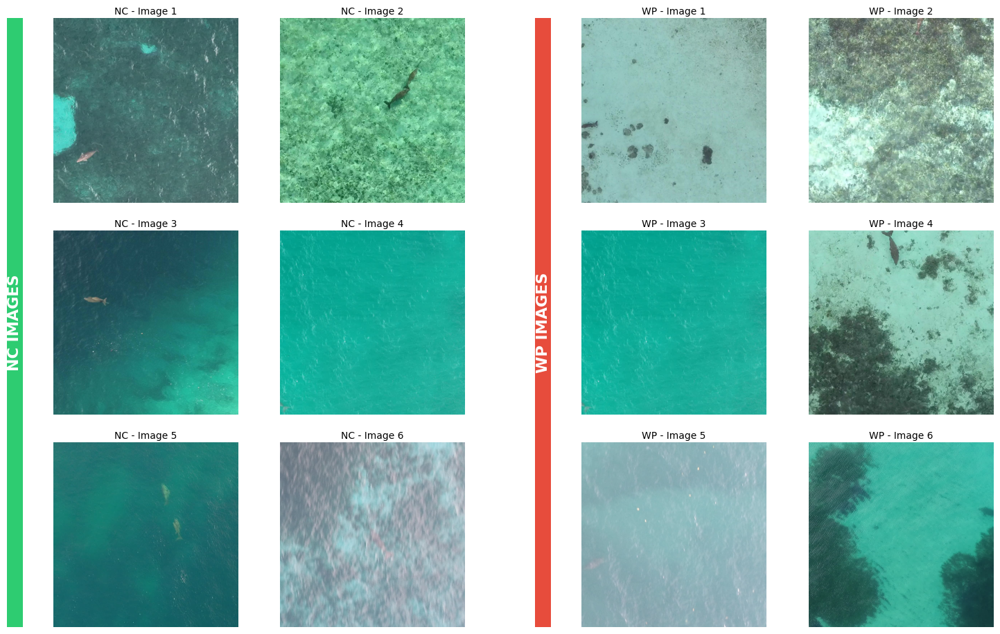

In [10]:
plot_nc_wp_comparison(list_a, list_b)

In [11]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image

def plot_nc_wp_horizontal_bars(nc_paths, wp_paths, save_path=None):
    """
    Plots 6 NC images and 6 WP images in a grid with horizontal colored header bars.
    
    Parameters:
        nc_paths (list): List of 6 filepaths for NC images.
        wp_paths (list): List of 6 filepaths for WP images.
        save_path (str, optional): Path to save the resulting figure.
    """
    if len(nc_paths) != 6 or len(wp_paths) != 6:
        raise ValueError("Both nc_paths and wp_paths must contain exactly 6 image paths.")
        
    # 16:11 provides a nice aspect ratio to accommodate the top headers
    fig = plt.figure(figsize=(16, 11))
    
    # Grid structure:
    # 4 rows: Row 0 is for the headers, Rows 1-3 are for the images
    # 4 columns: Columns 0-1 for NC, Columns 2-3 for WP
    gs = gridspec.GridSpec(
        nrows=4, 
        ncols=4, 
        height_ratios=[0.2, 2, 2, 2], # Narrow top row for the header bars
        wspace=0.15, 
        hspace=0.2
    )
    
    # -------------------------------------------------------------
    # 1. Draw Horizontal Label Bars (Row 0)
    # -------------------------------------------------------------
    # NC Header (Spans Row 0, Columns 0 and 1)
    ax_nc_bar = fig.add_subplot(gs[0, :2])
    ax_nc_bar.set_facecolor('#2ecc71') # Flat UI green
    ax_nc_bar.set_xticks([])
    ax_nc_bar.set_yticks([])
    ax_nc_bar.text(0.5, 0.5, 'NC IMAGES', color='white', fontsize=16, 
                   fontweight='bold', ha='center', va='center')
    for spine in ax_nc_bar.spines.values():
        spine.set_visible(False)

    # WP Header (Spans Row 0, Columns 2 and 3)
    ax_wp_bar = fig.add_subplot(gs[0, 2:])
    ax_wp_bar.set_facecolor('#e74c3c') # Flat UI red
    ax_wp_bar.set_xticks([])
    ax_wp_bar.set_yticks([])
    ax_wp_bar.text(0.5, 0.5, 'WP IMAGES', color='white', fontsize=16, 
                   fontweight='bold', ha='center', va='center')
    for spine in ax_wp_bar.spines.values():
        spine.set_visible(False)

    # -------------------------------------------------------------
    # 2. Populate Image Subplots (Rows 1 to 3)
    # -------------------------------------------------------------
    for idx in range(6):
        # Image rows are shifted by +1 because row 0 is the header
        row = (idx // 2) + 1
        col_offset = idx % 2
        
        # --- Plot NC Image (Columns 0 and 1) ---
        ax_nc = fig.add_subplot(gs[row, col_offset])
        try:
            img_nc = Image.open(nc_paths[idx])
            ax_nc.imshow(img_nc, aspect='equal') 
        except Exception as e:
            ax_nc.text(0.5, 0.5, f"Error Loading:\n{nc_paths[idx].split('/')[-1]}", 
                       ha='center', va='center', color='red', wrap=True)
        ax_nc.axis('off')
        ax_nc.set_title(f"NC - Image {idx+1}", fontsize=10, pad=4)

        # --- Plot WP Image (Columns 2 and 3) ---
        ax_wp = fig.add_subplot(gs[row, col_offset + 2])
        try:
            img_wp = Image.open(wp_paths[idx])
            ax_wp.imshow(img_wp, aspect='equal')
        except Exception as e:
            ax_wp.text(0.5, 0.5, f"Error Loading:\n{wp_paths[idx].split('/')[-1]}", 
                       ha='center', va='center', color='red', wrap=True)
        ax_wp.axis('off')
        ax_wp.set_title(f"WP - Image {idx+1}", fontsize=10, pad=4)

    # Clean up outer margins
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved successfully to: {save_path}")
        
    plt.show()

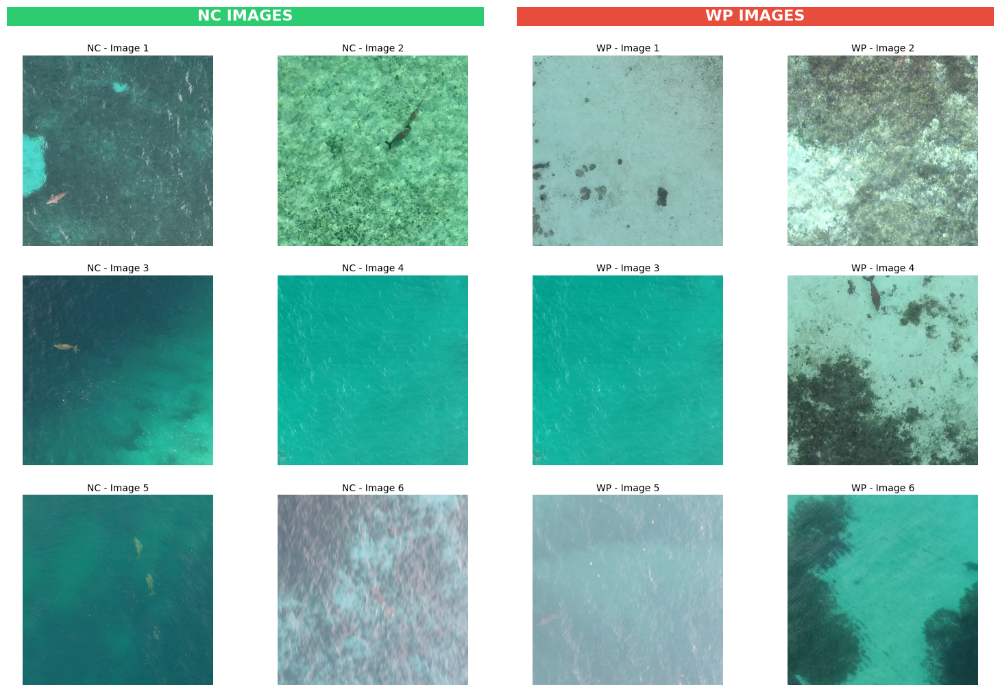

In [12]:
plot_nc_wp_horizontal_bars(list_a, list_b)

In [10]:
session = fo.launch_app(dataset,auto=False,port=5151)

NameError: name 'fo' is not defined

In [11]:
wp_list = ['/share/home/e2406743/dataset/tiles_all/wp125/positive/images/FPLAN_P4_UM_M1_F2_GSPzip-64e33dff4c243_209__tile_800_2976_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/wp125/positive/images/MAN_P4_FRIWEN_M11_F3_GSP_DJI_0009-66acd97abe6b7_38__tile_1136_2400_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/wp125/positive/images/MAN_P4_GAM_M1_F2_GSP_DJI_0299-64ec46dd2c86c_36__tile_800_1600_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/wp125/positive/images/MAN_P4_UM_M5_F2_GSP_DJI_0221-657c57e81272f_1__tile_1136_1600_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/umflplan/positive/images/FPLAN_M4_UM_M13_F1_2025_P_3-6973996330251_217__tile_800_4256_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/umflplan/positive/images/FPLAN_M4_UM_M40_F1_2025_P_2-699839d1afc67_315__tile_2932_2400_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/umflplan/positive/images/FPLAN_M4_UM_M46_F1_2025_P_3-699848dc6accc_119__tile_800_1600_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/umflplan/positive/images/FPLAN_M4_UM_M46_F1_2025_P_3-699848dc6accc_317__tile_1600_800_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/umflplan/positive/images/FPLAN_P4P_UM_M48_F1_2025_GSP-697e1055e6795_768__tile_800_800_t1024_o224.jpg'
 ]

nc_list = ['/share/home/e2406743/dataset/tiles_all/nc765/positive/images/GH024196-60e7133bc685e_1513__tile_0_800_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/nc765/positive/images/GH024197-60e713a81ab1d_1451__tile_496_1680_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/nc765/positive/images/GH024222-619e3ad527b0b_216__tile_0_800_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/nc765/positive/images/GH034196-60e7f35f21cd1_790__tile_496_0_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/nc765/positive/images/GH034200-60f5479af38d8_1158__tile_496_1680_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/nc765/positive/images/GH034207-611a6e787d0af_1997__tile_496_1600_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/nc765/positive/images/GH044209-6110f222b5b35_553__tile_0_800_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/nc765/positive/images/GH054222-619e46bead185_104__tile_496_800_t1024_o224.jpg',
 '/share/home/e2406743/dataset/tiles_all/nc765/positive/images/GH064207-611a673a5a0a3_1291__tile_0_0_t1024_o224.jpg']

In [13]:
import math
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image

def plot_flexible_comparison(nc_paths, wp_paths, cols_per_group=2, save_path=None):
    """
    Plots an arbitrary, equal number of NC and WP images side-by-side.
    
    Parameters:
        nc_paths (list): List of filepaths for NC images.
        wp_paths (list): List of filepaths for WP images.
        cols_per_group (int): Number of image columns for each category. Default is 2.
        save_path (str, optional): Path to save the resulting figure.
    """
    if len(nc_paths) != len(wp_paths):
        raise ValueError(
            f"The number of NC images ({len(nc_paths)}) must match "
            f"the number of WP images ({len(wp_paths)})."
        )
    
    num_images = len(nc_paths)
    
    # Calculate rows needed for the images, plus 1 extra row for the top headers
    num_image_rows = math.ceil(num_images / cols_per_group)
    total_rows = num_image_rows + 1
    total_cols = cols_per_group * 2  # Left half for NC, Right half for WP
    
    # Dynamically scale the figure size based on your column/row choices 
    # to keep images from stretching or looking squished.
    fig_width = max(12, 4 * total_cols)
    fig_height = max(4, 3.5 * total_rows)
    fig = plt.figure(figsize=(fig_width, fig_height))
    
    # Height ratio: Header row gets a small narrow slice (0.15), image rows get 2.0
    height_ratios = [0.15] + [2.0] * num_image_rows
    
    gs = gridspec.GridSpec(
        nrows=total_rows, 
        ncols=total_cols, 
        height_ratios=height_ratios,
        wspace=0.1, 
        hspace=0.1
    )
    
    # -------------------------------------------------------------
    # 1. Draw Horizontal Label Bars (Row 0)
    # -------------------------------------------------------------
    # NC Header (Spans Row 0 from col 0 up to cols_per_group)
    ax_nc_bar = fig.add_subplot(gs[0, :cols_per_group])
    ax_nc_bar.set_facecolor('#457fe3')  # Green
    ax_nc_bar.set_xticks([])
    ax_nc_bar.set_yticks([])
    ax_nc_bar.text(0.5, 0.5, 'New Caledonia', color='white', fontsize=16, 
                   fontweight='bold', ha='center', va='center')
    for spine in ax_nc_bar.spines.values():
        spine.set_visible(False)

    # WP Header (Spans Row 0 from cols_per_group to the end)
    ax_wp_bar = fig.add_subplot(gs[0, cols_per_group:])
    ax_wp_bar.set_facecolor("#53ba95")  # Red
    ax_wp_bar.set_xticks([])
    ax_wp_bar.set_yticks([])
    ax_wp_bar.text(0.5, 0.5, 'West Papua', color='white', fontsize=16, 
                   fontweight='bold', ha='center', va='center')
    for spine in ax_wp_bar.spines.values():
        spine.set_visible(False)

    # -------------------------------------------------------------
    # 2. Populate Image Subplots
    # -------------------------------------------------------------
    for idx in range(num_images):
        row = (idx // cols_per_group) + 1
        col_offset = idx % cols_per_group
        
        # --- Plot NC Image (Left Side) ---
        ax_nc = fig.add_subplot(gs[row, col_offset])
        try:
            img_nc = Image.open(nc_paths[idx])
            ax_nc.imshow(img_nc, aspect='equal') 
        except Exception as e:
            ax_nc.text(0.5, 0.5, "Error Loading\nImage", 
                       ha='center', va='center', color='red', fontsize=10)
        ax_nc.axis('off')

        # --- Plot WP Image (Right Side) ---
        ax_wp = fig.add_subplot(gs[row, col_offset + cols_per_group])
        try:
            img_wp = Image.open(wp_paths[idx])
            ax_wp.imshow(img_wp, aspect='equal')
        except Exception as e:
            ax_wp.text(0.5, 0.5, "Error Loading\nImage", 
                       ha='center', va='center', color='red', fontsize=10)
        ax_wp.axis('off')

    # -------------------------------------------------------------
    # 3. Clean up empty grid slots (if total images don't fill the last row)
    # -------------------------------------------------------------
    total_slots_per_group = num_image_rows * cols_per_group
    if num_images < total_slots_per_group:
        for empty_idx in range(num_images, total_slots_per_group):
            empty_row = (empty_idx // cols_per_group) + 1
            empty_col_offset = empty_idx % cols_per_group
            
            # Hide empty NC space
            ax_empty_nc = fig.add_subplot(gs[empty_row, empty_col_offset])
            ax_empty_nc.axis('off')
            
            # Hide empty WP space
            ax_empty_wp = fig.add_subplot(gs[empty_row, empty_col_offset + cols_per_group])
            ax_empty_wp.axis('off')

    # Minimal margins to maximize image rendering space
    plt.subplots_adjust(left=0.02, right=0.98, top=0.96, bottom=0.02)
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved successfully to: {save_path}")
        
    plt.show()

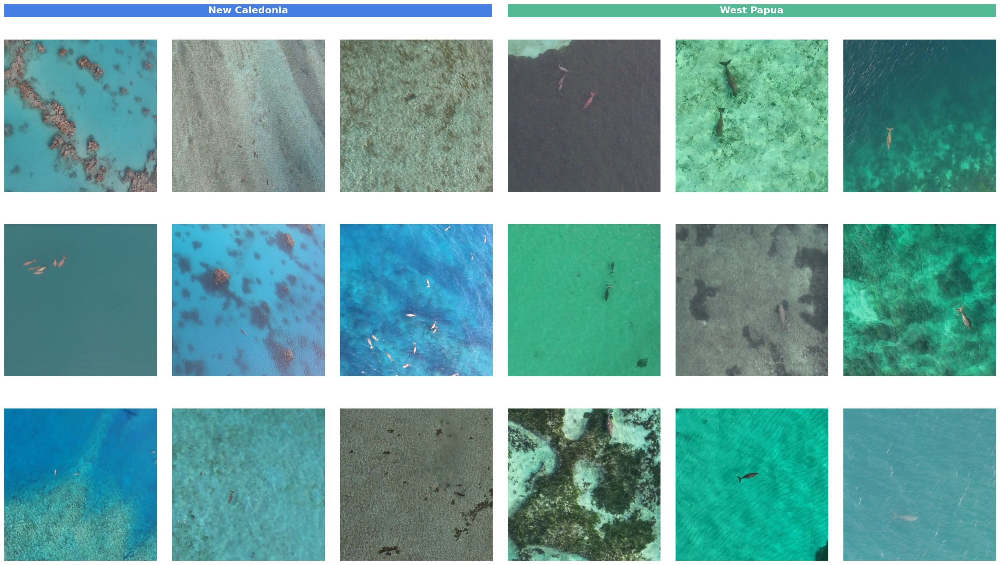

In [14]:
plot_flexible_comparison(nc_list, wp_list, cols_per_group=3)

In [15]:
import math
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image

def plot_flexible_comparison_with_separator(nc_paths, wp_paths, cols_per_group=2, save_path=None):
    """
    Plots an arbitrary, equal number of NC and WP images side-by-side
    with horizontal header bars and a vertical separator bar in the middle.
    
    Parameters:
        nc_paths (list): List of filepaths for NC images.
        wp_paths (list): List of filepaths for WP images.
        cols_per_group (int): Number of image columns for each category.
        save_path (str, optional): Path to save the resulting figure.
    """
    if len(nc_paths) != len(wp_paths):
        raise ValueError(
            f"The number of NC images ({len(nc_paths)}) must match "
            f"the number of WP images ({len(wp_paths)})."
        )
    
    num_images = len(nc_paths)
    
    # Calculate grid geometry
    num_image_rows = math.ceil(num_images / cols_per_group)
    total_rows = num_image_rows + 1
    
    # Left image columns + Middle separator column (1) + Right image columns
    total_cols = (cols_per_group * 2) + 1
    
    # Determine the column index where the separator sits
    separator_col_idx = cols_per_group
    
    # Set the width of the middle separator (make it very thin, e.g., 0.1 ratio)
    width_ratios = [2.0] * cols_per_group + [0.1] + [2.0] * cols_per_group
    
    # Dynamically scale the figure size
    fig_width = max(12, 4 * (total_cols - 1))
    fig_height = max(4, 3.5 * total_rows)
    fig = plt.figure(figsize=(fig_width, fig_height))
    
    # Height ratio: Header row gets a small narrow slice (0.15), image rows get 2.0
    height_ratios = [0.15] + [2.0] * num_image_rows
    
    gs = gridspec.GridSpec(
        nrows=total_rows, 
        ncols=total_cols, 
        height_ratios=height_ratios,
        width_ratios=width_ratios,
        wspace=0.1, 
        hspace=0.1
    )
    
    # -------------------------------------------------------------
    # 1. Draw Horizontal Label Bars (Row 0)
    # -------------------------------------------------------------
    # NC Header (Spans Row 0, from column 0 up to separator)
    ax_nc_bar = fig.add_subplot(gs[0, :separator_col_idx])
    ax_nc_bar.set_facecolor('#2ecc71')  # Green
    ax_nc_bar.set_xticks([])
    ax_nc_bar.set_yticks([])
    ax_nc_bar.text(0.5, 0.5, 'NC IMAGES', color='white', fontsize=16, 
                   fontweight='bold', ha='center', va='center')
    for spine in ax_nc_bar.spines.values():
        spine.set_visible(False)

    # WP Header (Spans Row 0, from right of separator to the end)
    ax_wp_bar = fig.add_subplot(gs[0, separator_col_idx + 1:])
    ax_wp_bar.set_facecolor('#e74c3c')  # Red
    ax_wp_bar.set_xticks([])
    ax_wp_bar.set_yticks([])
    ax_wp_bar.text(0.5, 0.5, 'WP IMAGES', color='white', fontsize=16, 
                   fontweight='bold', ha='center', va='center')
    for spine in ax_wp_bar.spines.values():
        spine.set_visible(False)

    # -------------------------------------------------------------
    # 2. Draw Vertical Separator Bar
    # -------------------------------------------------------------
    # Spans all rows (including header and images) in the separator column
    ax_separator = fig.add_subplot(gs[:, separator_col_idx])
    ax_separator.set_facecolor('#bdc3c7')  # Light slate gray (change to 'black' or any hex if desired)
    ax_separator.set_xticks([])
    ax_separator.set_yticks([])
    for spine in ax_separator.spines.values():
        spine.set_visible(False)

    # -------------------------------------------------------------
    # 3. Populate Image Subplots
    # -------------------------------------------------------------
    for idx in range(num_images):
        row = (idx // cols_per_group) + 1
        col_offset = idx % cols_per_group
        
        # --- Plot NC Image (Left Side) ---
        ax_nc = fig.add_subplot(gs[row, col_offset])
        try:
            img_nc = Image.open(nc_paths[idx])
            ax_nc.imshow(img_nc, aspect='equal') 
        except Exception as e:
            ax_nc.text(0.5, 0.5, "Error Loading\nImage", 
                       ha='center', va='center', color='red', fontsize=10)
        ax_nc.axis('off')

        # --- Plot WP Image (Right Side, shifted past separator) ---
        ax_wp = fig.add_subplot(gs[row, col_offset + separator_col_idx + 1])
        try:
            img_wp = Image.open(wp_paths[idx])
            ax_wp.imshow(img_wp, aspect='equal')
        except Exception as e:
            ax_wp.text(0.5, 0.5, "Error Loading\nImage", 
                       ha='center', va='center', color='red', fontsize=10)
        ax_wp.axis('off')

    # -------------------------------------------------------------
    # 4. Clean up empty grid slots
    # -------------------------------------------------------------
    total_slots_per_group = num_image_rows * cols_per_group
    if num_images < total_slots_per_group:
        for empty_idx in range(num_images, total_slots_per_group):
            empty_row = (empty_idx // cols_per_group) + 1
            empty_col_offset = empty_idx % cols_per_group
            
            # Hide empty NC space
            ax_empty_nc = fig.add_subplot(gs[empty_row, empty_col_offset])
            ax_empty_nc.axis('off')
            
            # Hide empty WP space
            ax_empty_wp = fig.add_subplot(gs[empty_row, empty_col_offset + separator_col_idx + 1])
            ax_empty_wp.axis('off')

    # Minimal margins to maximize image rendering space
    plt.subplots_adjust(left=0.02, right=0.98, top=0.96, bottom=0.02)
    
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"Figure saved successfully to: {save_path}")
        
    plt.show()

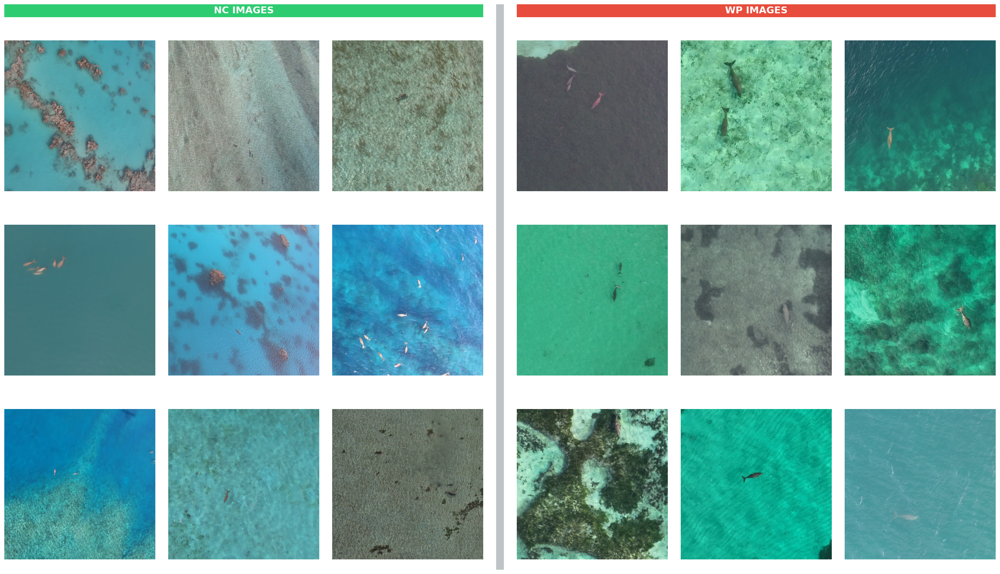

In [16]:
plot_flexible_comparison_with_separator(nc_list, wp_list, cols_per_group=3)

# Morphological Analysis

In [32]:
def plot_dugong_morphology_dashboard(dataset, save_path=None, dpi=200, style="seaborn-v0_8-white"):
    """
    Presentation-quality figure combining:
      Left  : Width vs Height scatter with marginal histograms
      Right : Area distribution (log scale) with COCO size thresholds

    Background/panel/grid/spine styling comes from `style` (any name in
    plt.style.available), applied via plt.style.context for the duration of
    this plot only -- nothing leaks into the rest of the notebook session.
    The explicit label/series colors below (CYAN, RED, AMBER, etc.) are
    NOT touched by the style and stay exactly as defined.

    Parameters
    ----------
    dataset   : FiftyOne dataset with ground_truth and metadata fields
    save_path : optional path to save the figure
    dpi       : output resolution
    style     : matplotlib style name (default "seaborn-v0_8-white")
    """
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    import matplotlib.ticker as ticker
    import numpy as np

    # ── Collect data ──────────────────────────────────────────────────────────
    widths, heights, areas = [], [], []

    for sample in dataset.iter_samples(progress=True):
        if sample.ground_truth is None or sample.metadata is None:
            continue
        img_w = sample.metadata.width
        img_h = sample.metadata.height
        for det in sample.ground_truth.detections:
            bx, by, bw, bh = det.bounding_box
            w = bw * img_w
            h = bh * img_h
            widths.append(w)
            heights.append(h)
            areas.append(w * h)

    widths  = np.array(widths)
    heights = np.array(heights)
    areas   = np.array(areas)
    n       = len(widths)

    print(f"Annotations   : {n}")
    print(f"Width         : mean={widths.mean():.1f}px  median={np.median(widths):.1f}px")
    print(f"Height        : mean={heights.mean():.1f}px  median={np.median(heights):.1f}px")
    print(f"Area          : mean={areas.mean():.0f}px²  median={np.median(areas):.0f}px²")

    # ── Explicit label/series palette -- UNCHANGED by style ──────────────────
    WHITE   = "#f0f6fc"
    MUTED   = "#8b949e"
    CYAN    = "#d5330edd"
    RED     = "#ff4444"
    AMBER   = "#ffaa00"
    GREEN   = "#3fb950"
    MAGENTA = "#dd8b11"

    with plt.style.context(style):
        # ── Layout ────────────────────────────────────────────────────────────
        fig = plt.figure(figsize=(18, 8))

        outer = gridspec.GridSpec(
            2, 1,
            height_ratios=[3, 2],
            hspace=0.20,
        )

        # ── Top block : scatter + marginals ───────────────────────────────────
        gs_top = gridspec.GridSpecFromSubplotSpec(
            2, 2,
            subplot_spec=outer[0],
            width_ratios=[3, 1],
            height_ratios=[1, 3],
            wspace=0.03,
            hspace=0.03,
        )

        ax_top = fig.add_subplot(gs_top[0, 0])
        ax_scatter = fig.add_subplot(gs_top[1, 0], sharex=ax_top)
        ax_right = fig.add_subplot(gs_top[1, 1], sharey=ax_scatter)

        # ── Bottom block : area histogram ─────────────────────────────────────
        ax_area = fig.add_subplot(outer[1])

        # ── Scatter: width vs height ───────────────────────────────────────────
        mw, mh = widths.mean(), heights.mean()

        # Colour points by area (log scale) for extra information density
        log_a = np.log10(areas)
        sc = ax_scatter.scatter(
            widths, heights,
            c=log_a, cmap="plasma",
            s=16, alpha=0.45, linewidths=0, zorder=3,
        )

        # Mean crosshair
        # ax_scatter.axvline(mw, color=RED,   linewidth=1.6, linestyle="--", zorder=4)
        # ax_scatter.axhline(mh, color=AMBER, linewidth=1.6, linestyle="--", zorder=4)
        # ax_scatter.plot(mw, mh, marker="X", color=WHITE,
        #                 markersize=11, zorder=5, markeredgecolor="black",
        #                 label=f"Mean  ({mw:.0f} × {mh:.0f} px)")

        ax_scatter.set_xlabel("Width (px)",  fontsize=9, labelpad=4)
        ax_scatter.set_ylabel("Height (px)", fontsize=9, labelpad=4)
        ax_scatter.legend(fontsize=8, loc="upper right")

        # Inline axis labels for mean lines
        xlim = ax_scatter.get_xlim()
        ylim = ax_scatter.get_ylim()
        # ax_scatter.text(mw + (xlim[1]-xlim[0])*0.01, ylim[0] + (ylim[1]-ylim[0])*0.02,
        #                 f"μ_w={mw:.0f}px", color=RED, fontsize=7.5, va="bottom")
        # ax_scatter.text(xlim[0] + (xlim[1]-xlim[0])*0.01, mh + (ylim[1]-ylim[0])*0.01,
        #                 f"μ_h={mh:.0f}px", color=AMBER, fontsize=7.5, va="bottom")

        ## inline axis for threshold
        xlim_ = 224
        ylim_ = 224
        ax_scatter.axvline(xlim_, color=RED,   linewidth=1.6, linestyle="--", zorder=4)
        ax_scatter.axhline(ylim_, color=AMBER, linewidth=1.6, linestyle="--", zorder=4)
        ax_scatter.text(0,225,
                        f"224px threshold", color=RED, fontsize=7.5, va="bottom")
        # ax_scatter.text(224 + (xlim[1]-xlim[0])*0.01, mh + (ylim[1]-ylim[0])*0.01,
        #                 f"224px threshold", color=AMBER, fontsize=7.5, va="bottom")

        # Marginal top histogram (width)
        ax_top.hist(widths, bins=50, color=CYAN,
                    edgecolor="white", linewidth=0.2, alpha=0.85)
        #ax_top.axvline(mw, color=RED, linewidth=1.6, linestyle="--")
        ax_top.set_ylabel("Count", fontsize=7.5)
        plt.setp(ax_top.get_xticklabels(), visible=False)

        # Marginal right histogram (height)
        ax_right.hist(heights, bins=50, color=MAGENTA,
                      edgecolor="white", linewidth=0.2, alpha=0.85,
                      orientation="horizontal")
        #ax_right.axhline(mh, color=AMBER, linewidth=1.6, linestyle="--")
        ax_right.set_xlabel("Count", fontsize=7.5)
        plt.setp(ax_right.get_yticklabels(), visible=False)

        # ── Area histogram ─────────────────────────────────────────────────────
        small_thresh  = 32 ** 2    # 1 024 px²
        medium_thresh = 96 ** 2    # 9 216 px²

        pct_small  = (areas <  small_thresh).mean()  * 100
        pct_medium = ((areas >= small_thresh) & (areas < medium_thresh)).mean() * 100
        pct_large  = (areas >= medium_thresh).mean() * 100

        log_areas = np.log10(areas)
        n_hist, bin_edges, patches = ax_area.hist(
            log_areas, bins=60,
            edgecolor="white", linewidth=0.2, alpha=0.9, zorder=3,
        )
        # Colour bins by position
        norm_c = plt.Normalize(bin_edges[0], bin_edges[-1])
        cmap_h = plt.cm.YlOrRd
        for patch, left in zip(patches, bin_edges[:-1]):
            patch.set_facecolor(cmap_h(norm_c(left)))

        # COCO threshold lines
        for val, label, color, ls in [
            (small_thresh,  f"Small  <32²  ({pct_small:.0f}%)",   RED,   ":"),
            (medium_thresh, f"Medium 32²–96²  ({pct_medium:.0f}%)", AMBER, ":"),
        ]:
            ax_area.axvline(np.log10(val), color=color, linewidth=1.8,
                            linestyle=ls, label=label, zorder=4)

        # Mean and median
        # ax_area.axvline(np.log10(areas.mean()),   color="black", linewidth=1.5,
        #                 linestyle="--", label=f"Mean   {areas.mean():.0f} px²", zorder=4)
        # ax_area.axvline(np.log10(np.median(areas)), color=GREEN, linewidth=1.5,
        #                 linestyle="-.", label=f"Median {np.median(areas):.0f} px²", zorder=4)

        # Shaded size regions
        xmin, xmax = ax_area.get_xlim()
        ax_area.axvspan(xmin,                     np.log10(small_thresh),
                        alpha=0.07, color=RED,   zorder=1)
        ax_area.axvspan(np.log10(small_thresh),   np.log10(medium_thresh),
                        alpha=0.07, color=AMBER, zorder=1)
        ax_area.axvspan(np.log10(medium_thresh),  xmax,
                        alpha=0.07, color=GREEN, zorder=1)

        # Region labels inside shaded zones
        y_label = n_hist.max() * 0.88
        for x_pos, label, color in [
            ((xmin + np.log10(small_thresh)) / 2,
             f"Small\n{pct_small:.0f}%", RED),
            ((np.log10(small_thresh) + np.log10(medium_thresh)) / 2,
             f"Medium\n{pct_medium:.0f}%", AMBER),
            ((np.log10(medium_thresh) + xmax) / 2,
             f"Large\n{pct_large:.0f}%", GREEN),
        ]:
            ax_area.text(x_pos, y_label, label, color=color,
                         fontsize=8.5, ha="center", va="top", fontweight="bold")

        # x-axis tick labels as real px² values
        tick_vals = [100, 500, 1024, 5000, 9216, 30000, 100000, 300000]
        valid     = [v for v in tick_vals if log_areas.min() <= np.log10(v) <= log_areas.max()]
        ax_area.set_xticks([np.log10(v) for v in valid])
        ax_area.set_xticklabels([f"{v:,}" for v in valid], fontsize=7.5,
                                 rotation=30, ha="right")

        ax_area.set_xlabel("Bounding box area  (px², log scale)", fontsize=9, labelpad=4)
        ax_area.set_ylabel("Count", fontsize=9, labelpad=4)
        ax_area.legend(fontsize=8, loc="upper left")

        # ── Titles & suptitle ─────────────────────────────────────────────────
        fig.suptitle(
            "Dugong Morphology in pixel space",
            fontsize=12,
            #fontweight="bold",
            #familyfont = ""
            y=0.95,
        )

        # Bottom caption
        fig.text(
            0.5, 0.01,
            f"N={n} object-based dugong representations  |  "
            f"*COCO  format and analysis of datasets"
            f"  Small={pct_small:.0f}%  Medium={pct_medium:.0f}%  Large={pct_large:.0f}%",
            ha="center", fontsize=8, color=MUTED, style="italic",
        )

        fig.text(
            0.50, 0.90,
            "Width × Height Distribution",
            color=MUTED, fontsize=10, ha="center", style="italic",
        )

        fig.text(
            0.50, 0.42,
            "Bounding Box Area Distribution",
            color=MUTED, fontsize=10, ha="center", style="italic",
        )

        if save_path:
            plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
            print(f"Saved → {save_path}")

        plt.show()

    return fig, widths, heights, areas

In [18]:
## TO RUN ON THE CLOUD 

## preprocessed the data before starting the slide
## import embeddings <s
import os

# Define the URI to point to your manual process
os.environ["FIFTYONE_DATABASE_URI"] = "mongodb://localhost:44123"

import fiftyone as fo

# Verify connection
print(fo.core.odm.database.get_db_conn()) 


You are running the oldest supported major version of MongoDB. Please refer to https://deprecation.voxel51.com for deprecation notices. You can suppress this exception by setting your `database_validation` config parameter to `False`. See https://docs.voxel51.com/user_guide/config.html#configuring-a-mongodb-connection for more information
Database(MongoClient(host=['localhost:44123'], document_class=dict, tz_aware=False, connect=True, appname='fiftyone'), 'fiftyone')


In [19]:

dataset = fo.load_dataset("tiles_merged")

In [20]:
dataset

Name:        tiles_merged
Media type:  image
Num samples: 11123
Persistent:  True
Tags:        []
Sample fields:
    id:               fiftyone.core.fields.ObjectIdField
    filepath:         fiftyone.core.fields.StringField
    tags:             fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:         fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    created_at:       fiftyone.core.fields.DateTimeField
    last_modified_at: fiftyone.core.fields.DateTimeField
    type_label:       fiftyone.core.fields.StringField
    ground_truth:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)
    region:           fiftyone.core.fields.StringField
    mission_name:     fiftyone.core.fields.StringField
    parent_name:      fiftyone.core.fields.StringField
    gt_field:         fiftyone.core.fields.StringField
    min_area_ratio:   fiftyone.core.fields.FloatField
    n_boxes_in_tile:  fiftyone.core.fields.I

   0% ||------------|     0/11123 [12.3ms elapsed, ? remaining, ? samples/s] 

 100% |█████████████| 11123/11123 [4.0s elapsed, 0s remaining, 6.2K samples/s]        
Annotations   : 9265
Width         : mean=39.9px  median=32.0px
Height        : mean=39.7px  median=32.0px
Area          : mean=1964px²  median=1026px²


/tmp/ipykernel_3596198/3122153486.py:107: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax_scatter.legend(fontsize=8, loc="upper right")


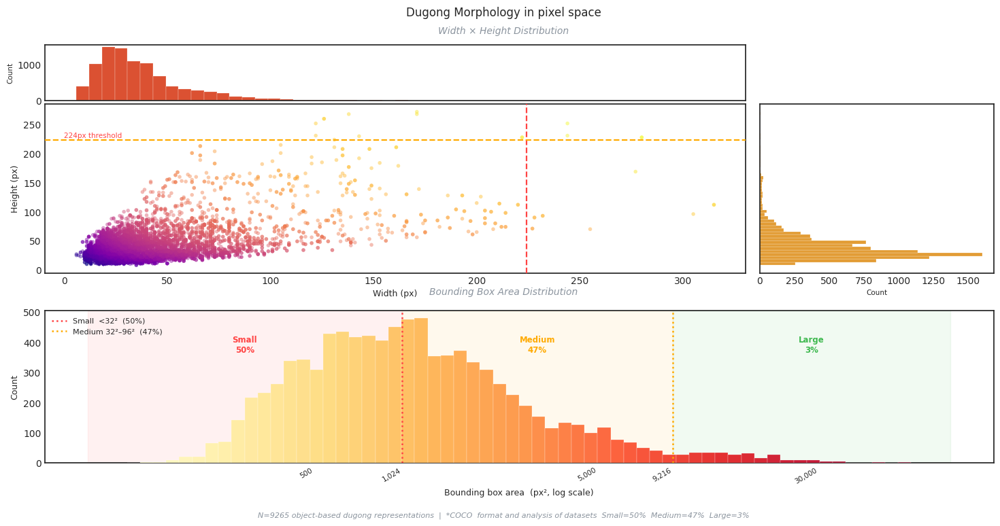

In [33]:
fig = plot_dugong_morphology_dashboard(dataset, style="seaborn-v0_8-white")

# Cosine Similarity of patch-tokens

In [3]:
from dotenv import load_dotenv
load_dotenv()

import fiftyone.utils.torch as fout
from huggingface_hub import login

if "HUGGING_FACE_API" in os.environ:
    login(token=os.environ["HUGGING_FACE_API"])

In [17]:
from transformers import AutoImageProcessor, AutoModel

MODEL_ID  = "facebook/dinov3-vitl16-pretrain-lvd1689m"
processor = AutoImageProcessor.from_pretrained(MODEL_ID)
model     = AutoModel.from_pretrained(MODEL_ID)

DEVICE='cuda'

Loading weights:   0%|          | 0/415 [00:00<?, ?it/s]

In [19]:
# Change resize target from 224x224 to e.g. 448x448 or 512x512
processor.size = {"height": 1024, "width": 1024}
# processor.do_resize stays True -- we WANT resizing here, just to a bigger target

print(processor.size)  # confirm: {'height': 448, 'width': 448}

{'height': 1024, 'width': 1024}


In [22]:
# ── Cell 1: Compute patch-token similarity matrices for a list of sample IDs ─
import torch
import torch.nn.functional as F
import numpy as np
from PIL import Image


def compute_similarity_matrices(
    dataset,
    sample_ids: list,
    processor,
    model,
    gt_field: str = "ground_truth",
    tile_size: int = 1024,
    stride: int = 16,
    n_registers: int = 4,
    device: str = 'cuda',
):
    """
    For each sample_id, loads the tile image from disk, retrieves the
    largest bounding box centroid, runs a DINOv3 forward pass, and
    computes the cosine similarity map of the anchor patch token against
    all 64x64 patch tokens.

    Parameters
    ----------
    dataset    : fo.Dataset
    sample_ids : list[str] -- ordered list of FiftyOne sample IDs
                  (caller controls which are WP and which are NC)
    processor  : HuggingFace processor with do_resize=False
    model      : base_model on DEVICE
    gt_field   : Detections field carrying bounding boxes
    tile_size  : int -- expected square tile side in pixels (default 1024)
    stride     : int -- ViT patch stride (default 16)
    n_registers: int -- register tokens to strip (default 4)
    device     : str

    Returns
    -------
    list of dicts, one per sample_id, with keys:
        sample_id    : str
        pil_img      : PIL.Image  -- raw tile image (RGB)
        detection    : fo.Detection or None -- largest detection used as anchor
        anchor_row   : int
        anchor_col   : int
        norm_map     : np.ndarray (grid_h, grid_w) -- cosine sim in [0,1]
        raw_map      : np.ndarray (grid_h, grid_w) -- cosine sim in [-1,1]
        grid_h       : int
        grid_w       : int
    """
    results = []
    grid_h = grid_w = tile_size // stride   # 1024/16 = 64

    model.to(device)   # ← add this: ensures weights and inputs are on the same device
    model.eval()
    
    for sid in sample_ids:
        sample = dataset[sid]

        # ── Load full tile image ─────────────────────────────────────────
        pil_img = Image.open(sample.filepath).convert("RGB")

        # ── Get anchor from largest detection centroid ───────────────────
        det_obj = sample[gt_field]
        detection = None
        anchor_row = grid_h // 2   # fallback: image centre
        anchor_col = grid_w // 2

        if det_obj and det_obj.detections:
            detection = max(
                det_obj.detections,
                key=lambda d: d.bounding_box[2] * d.bounding_box[3]
            )
            img_w, img_h = pil_img.size
            bx, by, bw, bh = detection.bounding_box
            cx = (bx + bw / 2) * img_w
            cy = (by + bh / 2) * img_h
            # Map centroid pixel to token grid index
            anchor_col = int(min(cx / stride, grid_w - 1))
            anchor_row = int(min(cy / stride, grid_h - 1))

        # ── Forward pass ─────────────────────────────────────────────────
        inputs = processor(images=pil_img, return_tensors="pt")
        inputs = {k: v.to(device) for k, v in inputs.items()}

        with torch.no_grad():
            out = model(**inputs, output_hidden_states=False)

        hidden     = out.last_hidden_state
        slice_start = 1 + n_registers
        patch_tokens = hidden[0, slice_start:, :].cpu()  # (4096, 1024)

        # ── Cosine similarity map ────────────────────────────────────────
        anchor_idx = anchor_row * grid_w + anchor_col
        normed     = F.normalize(patch_tokens.float(), dim=-1)
        anchor_vec = normed[anchor_idx]
        sim_scores = (normed @ anchor_vec).numpy()

        raw_map  = sim_scores.reshape(grid_h, grid_w)
        vmin, vmax = raw_map.min(), raw_map.max()
        norm_map = (raw_map - vmin) / (vmax - vmin + 1e-8)

        print(f"  {sid[:12]}...  anchor=({anchor_row},{anchor_col})  "
              f"sim range=[{raw_map.min():.3f}, {raw_map.max():.3f}]")

        results.append({
            "sample_id":  sid,
            "pil_img":    pil_img,
            "detection":  detection,
            "anchor_row": anchor_row,
            "anchor_col": anchor_col,
            "norm_map":   norm_map,
            "raw_map":    raw_map,
            "grid_h":     grid_h,
            "grid_w":     grid_w,
        })

    return results

In [29]:
# ── Cell 2: Visualization — 4 columns × 3 rows ───────────────────────────────
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np

BG       = "#E6E6EC"
WHITE    = "#121111"
MUTED    = "#5c5c70"
BBOX_CLR = "#00ff88"
ANCHOR_C = "#ff4444"
CMAP     = "RdYlGn"


def plot_similarity_grid(
    wp_results: list,
    nc_results: list,
    stride: int = 16,
    tile_size: int = 1024,
    figsize: tuple = (18, 13),
    use_norm: bool = True,
    save_path: str = None,
    dpi: int = 150,
):
    """
    4-column x 3-row figure comparing patch-token cosine similarity maps
    for 3 WP tiles and 3 NC tiles side by side.

    Layout:
        col 0: WP raw tile + bbox + anchor cross
        col 1: WP 64x64 similarity heatmap
        col 2: NC raw tile + bbox + anchor cross
        col 3: NC 64x64 similarity heatmap

    Parameters
    ----------
    wp_results : list of 3 dicts from compute_similarity_matrices()
    nc_results : list of 3 dicts from compute_similarity_matrices()
    stride     : int
    tile_size  : int
    figsize    : tuple
    use_norm   : bool -- if True show norm_map [0,1]; else raw_map [-1,1]
    save_path  : str or None
    dpi        : int
    """
    assert len(wp_results) == 3 and len(nc_results) == 3, \
        "Provide exactly 3 WP results and 3 NC results."

    vmin, vmax = (0, 1) if use_norm else (-1, 1)
    map_key    = "norm_map" if use_norm else "raw_map"

    fig, axes = plt.subplots(3, 4, figsize=figsize, facecolor=BG)
    fig.suptitle(
        "Patch-Token Cosine Similarity",
        color=WHITE, fontsize=15, fontweight="bold", y=1.0,
    )

    for row_idx in range(3):
        wp = wp_results[row_idx]
        nc = nc_results[row_idx]

        for col_group, result, region_label in [
            (0, wp, "WP"),
            (2, nc, "NC"),
        ]:
            pil_img    = result["pil_img"]
            detection  = result["detection"]
            anchor_row = result["anchor_row"]
            anchor_col = result["anchor_col"]
            sim_map    = result[map_key]
            img_w, img_h = pil_img.size

            # ── Image panel ───────────────────────────────────────────────
            ax_img = axes[row_idx, col_group]
            ax_img.set_facecolor(BG)
            ax_img.imshow(np.array(pil_img))

            if detection is not None:
                bx, by, bw, bh = detection.bounding_box
                rect = mpatches.Rectangle(
                    (bx * img_w, by * img_h), bw * img_w, bh * img_h,
                    linewidth=1.5, edgecolor=BBOX_CLR, facecolor="none", zorder=3,
                )
                ax_img.add_patch(rect)

            cross_x = (anchor_col + 0.5) * stride
            cross_y = (anchor_row + 0.5) * stride
            ax_img.plot(cross_x, cross_y, "+", color=ANCHOR_C,
                        markersize=4, markeredgewidth=1.5, zorder=4)

            # Column header only on first row
            if row_idx == 0:
                ax_img.set_title(f"{region_label} tile 1024x1024",
                                 color=WHITE, fontsize=10, pad=6)
            ax_img.axis("off")

            # ── Similarity heatmap panel ──────────────────────────────────
            ax_sim = axes[row_idx, col_group + 1]
            ax_sim.set_facecolor(BG)
            im = ax_sim.imshow(
                sim_map, cmap=CMAP, vmin=vmin, vmax=vmax,
                interpolation="nearest",
            )
            ax_sim.plot(anchor_col, anchor_row, "+", color=ANCHOR_C,
                        markersize=8, markeredgewidth=2.0, zorder=3)

            if row_idx == 0:
                ax_sim.set_title(f"Cosine Similarity Matrix",
                                 color=WHITE, fontsize=10, pad=6)
            ax_sim.set_xticks([])
            ax_sim.set_yticks([])
            for sp in ax_sim.spines.values():
                sp.set_edgecolor("#444466")

            cbar = plt.colorbar(im, ax=ax_sim, fraction=0.046, pad=0.04)
            cbar.ax.tick_params(colors=MUTED, labelsize=6)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches="tight",
                    facecolor=fig.get_facecolor())
        print(f"Saved -> {save_path}")

    plt.show()
    return fig

In [8]:
dataset = fo.load_dataset("tiles_merged")

session = fo.launch_app(dataset,auto=False, port=5151)

Session launched. Run `session.show()` to open the App in a cell output.


In [14]:
from fiftyone import ViewField
pos = dataset.match(
    ViewField("type_label").is_in(["positive"])
)
pos_wp = pos.match(
    ViewField("region").contains_str("WP")
)
#pos_wp
session.view = pos_wp

In [15]:

session.selected

['6a33d1a619d8f6f6ef569334',
 '6a33c5818be790ca1e89bb98',
 '6a33c5818be790ca1e89bc05']

Computing WP similarity matrices ...
  6a33d1a619d8...  anchor=(38,32)  sim range=[0.074, 1.000]
  6a33c5818be7...  anchor=(30,29)  sim range=[0.068, 1.000]
  6a33c5818be7...  anchor=(15,28)  sim range=[0.166, 1.000]

Computing NC similarity matrices ...
  6a33c2d08be7...  anchor=(42,39)  sim range=[0.132, 1.000]
  6a33c2d08be7...  anchor=(40,38)  sim range=[0.147, 1.000]
  6a33c2d08be7...  anchor=(32,29)  sim range=[0.119, 1.000]
Saved -> wp_nc_similarity_grid.png


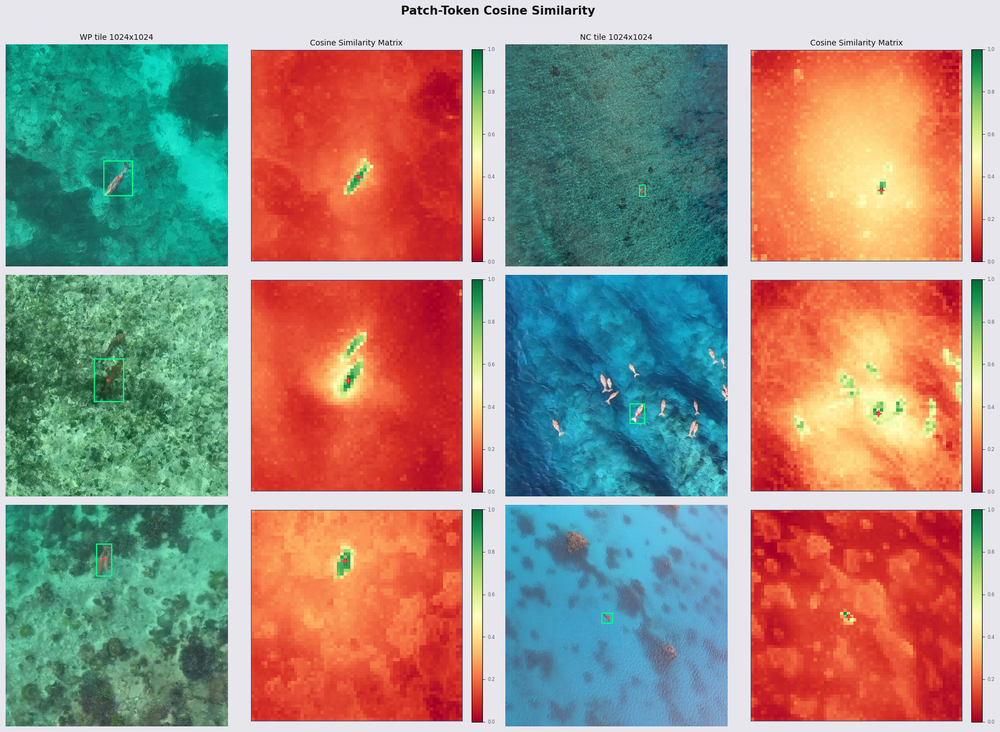

In [30]:
# ── Cell 3: Run ──────────────────────────────────────────────────────────────
WP_IDS =['6a33d1a619d8f6f6ef569334',
 '6a33c5818be790ca1e89bb98',
 '6a33c5818be790ca1e89bc05']

NC_IDS = ['6a33c2d08be790ca1e89a3ea',
 '6a33c2d08be790ca1e89a433',
 '6a33c2d08be790ca1e89a403']


print("Computing WP similarity matrices ...")
wp_results = compute_similarity_matrices(
    dataset, 
    WP_IDS, 
    processor, 
    model,
    gt_field="ground_truth", tile_size=1024,
)

print("\nComputing NC similarity matrices ...")
nc_results = compute_similarity_matrices(
    dataset, 
    NC_IDS, 
    processor, 
    model,
    gt_field="ground_truth", tile_size=1024,
)

fig = plot_similarity_grid(
    wp_results, nc_results,
    use_norm=True,
    save_path="wp_nc_similarity_grid.png",
)

# CLustered cosine similarity

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import numpy as np
from PIL import Image
from sklearn.preprocessing import normalize
import torch
import torch.nn.functional as F


def plot_cluster_cosine_grid(
    cluster_lists: list,           # list of 4 lists, each with 4 sample_ids
    dataset,
    lookup: dict,                  # {sample_id: embedding_vector} from build_embedding_lookup
    figsize=(18, 10),
    bbox_color="#00ff88",
    highlight_color="#ff4444",
    other_color="#aaaacc",
    gt_field="ground_truth",
    save_path=None,
    dpi=150,
):
    """
    4 rows x 7 columns figure (col 0 = anchor image, then alternating
    cosine-sim text column + image column for the 3 remaining cluster members).

    Each cosine-sim text column shows 4 stacked values:
        cos(anchor_0, this_image)
        cos(anchor_1, this_image)
        cos(anchor_2, this_image)
        cos(anchor_3, this_image)
    The value corresponding to the current row's own anchor is highlighted
    in red; the others are shown in muted grey.

    Parameters
    ----------
    cluster_lists : list of 4 lists, each containing 4 sample_id strings.
                    cluster_lists[i][0] is the anchor for cluster i.
    dataset       : fo.Dataset
    lookup        : {sample_id: np.ndarray(1024,)} from build_embedding_lookup()
    """
    assert len(cluster_lists) == 4 and all(len(c) == 4 for c in cluster_lists), \
        "Provide exactly 4 clusters, each with exactly 4 sample_ids."

    N_CLUSTERS  = 4
    N_IMGS      = 4   # anchor + 3 others
    N_NON_ANCHOR = N_IMGS - 1   # 3

    # ── Pre-compute L2-normalised anchor embeddings ───────────────────────────
    anchor_ids   = [cluster_lists[i][0] for i in range(N_CLUSTERS)]
    anchor_embs  = np.stack([
        lookup[sid] for sid in anchor_ids
    ], axis=0)                                           # (4, 1024)
    anchor_norm  = anchor_embs / (
        np.linalg.norm(anchor_embs, axis=1, keepdims=True) + 1e-12
    )

    # ── Pre-load all images ────────────────────────────────────────────────────
    def load_img(sid):
        sample = dataset[sid]
        return Image.open(sample.filepath).convert("RGB")

    def draw_bbox(ax, sample, pil_img):
        det_obj = sample[gt_field]
        if det_obj and det_obj.detections:
            img_w, img_h = pil_img.size
            for det in det_obj.detections:
                bx, by, bw, bh = det.bounding_box
                rect = mpatches.Rectangle(
                    (bx * img_w, by * img_h), bw * img_w, bh * img_h,
                    linewidth=1.5, edgecolor=bbox_color, facecolor="none",
                )
                ax.add_patch(rect)

    # Layout: 4 rows, 7 cols = anchor(1) + [sim(1) + img(1)] x 3
    n_cols = 1 + N_NON_ANCHOR * 2   # = 7
    col_widths = [3] + [0.7, 3] * N_NON_ANCHOR   # anchor wide, sim narrow, img wide

    fig, axes = plt.subplots(
        N_CLUSTERS, n_cols,
        figsize=figsize,
        gridspec_kw={"width_ratios": col_widths, "wspace": 0.05, "hspace": 0.15},
    )

    for row_idx in range(N_CLUSTERS):
        cluster = cluster_lists[row_idx]
        anchor_sid = cluster[0]

        # ── Column 0: anchor image ────────────────────────────────────────
        ax_anchor = axes[row_idx, 0]
        anchor_img = load_img(anchor_sid)
        ax_anchor.imshow(np.array(anchor_img))
        #draw_bbox(ax_anchor, dataset[anchor_sid], anchor_img)
        ax_anchor.set_xticks([]); ax_anchor.set_yticks([])
        for sp in ax_anchor.spines.values():
            sp.set_edgecolor(highlight_color)
            sp.set_linewidth(0.5)
        if row_idx == 0:
            ax_anchor.set_title("Anchor", fontsize=10, pad=4)

        # ── Columns 1-6: alternating [sim text | image] ──────────────────
        for img_pos in range(N_NON_ANCHOR):   # 0,1,2 -> members 1,2,3
            sid = cluster[img_pos + 1]
            col_sim = 1 + img_pos * 2    # 1, 3, 5
            col_img = col_sim + 1        # 2, 4, 6

            # Compute embedding of this image
            emb = lookup[sid]
            emb_norm = emb / (np.linalg.norm(emb) + 1e-12)

            # Cosine similarity against ALL 4 anchors
            sims = anchor_norm @ emb_norm   # (4,)

            # ── Sim text column ───────────────────────────────────────────
            ax_sim = axes[row_idx, col_sim]
            ax_sim.axis("off")

            # Stack 4 similarity values vertically, highlight current row
            for anchor_idx, sim_val in enumerate(sims):
                is_own = (anchor_idx == row_idx)
                color  = highlight_color if is_own else other_color
                weight = "bold" if is_own else "normal"
                fontsize = 9 if is_own else 7.5
                y_pos = 0.88 - anchor_idx * 0.22   # evenly spaced top to bottom

                ax_sim.text(
                    0.5, y_pos,
                    f"A{anchor_idx+1}: {sim_val:.3f}",
                    transform=ax_sim.transAxes,
                    ha="center", va="top",
                    fontsize=fontsize, color=color, fontweight=weight,
                )

            if row_idx == 0:
                ax_sim.set_title("Cosine \n Similarity", fontsize=6, color="#555555", pad=4)

            # ── Image column ──────────────────────────────────────────────
            ax_img = axes[row_idx, col_img]
            member_img = load_img(sid)
            ax_img.imshow(np.array(member_img))
            #draw_bbox(ax_img, dataset[sid], member_img)
            ax_img.set_xticks([]); ax_img.set_yticks([])
            for sp in ax_img.spines.values():
                sp.set_linewidth(0.1)
                sp.set_edgecolor("#cccccc")

            if row_idx == 0:
                ax_img.set_title(f"Member {img_pos+2}", fontsize=10, pad=4)

    # Row labels on the left
    for row_idx in range(N_CLUSTERS):
        axes[row_idx, 0].set_ylabel(
            f"Cluster {row_idx+1}", fontsize=10, fontweight="bold", rotation=90,
            labelpad=6,
        )

    fig.suptitle(
        "Intra and inter-cluster similarity",
        fontsize=13, fontweight="bold", y=0.98,
    )

    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
        print(f"Saved -> {save_path}")

    plt.show()
    return fig

In [15]:
fo.list_datasets()

['FLPLAN',
 'UM_teste',
 'WPonly_1024ov224',
 'flplan200',
 'flplanpatches',
 'nc765',
 'nc765_T1024ov224',
 'nc765_T2048ov224',
 'tiles2048_merged',
 'tiles_merged',
 'tiles_merged_2048',
 'train_nc_wp_T1024ov224',
 'umflplan_T1024ov224',
 'umflplan_T2048ov224',
 'wp125',
 'wp125_T1024ov224',
 'wp125_T2048ov224',
 'wp_final_test']

In [16]:
from fiftyone import ViewField
dataset = fo.load_dataset("tiles_merged")

positive_view = dataset.match(
    ViewField("type_label").contains_str("positive")
)


In [17]:
session = fo.launch_app(dataset, auto=False,port=5151)
session.view = positive_view

Session launched. Run `session.show()` to open the App in a cell output.


In [18]:
session.selected

['6a33c5818be790ca1e89bb9a',
 '6a33c5818be790ca1e89bc0b',
 '6a33c5818be790ca1e89bb3f',
 '6a33c2d28be790ca1e89a7fb',
 '6a33c2d28be790ca1e89a822',
 '6a33c2d28be790ca1e89a7ed',
 '6a33c2d28be790ca1e89a82d',
 '6a33c2d28be790ca1e89a8aa',
 '6a33c2d28be790ca1e89a6e6',
 '6a33c2d08be790ca1e89a409',
 '6a33c2d28be790ca1e89a770',
 '6a33c2d28be790ca1e89a92b',
 '6a33d1a619d8f6f6ef569335',
 '6a33d1a619d8f6f6ef56932a',
 '6a33d1a619d8f6f6ef5692fc',
 '6a33c5818be790ca1e89bb7c']

In [5]:
import numpy as np

def build_embedding_lookup(ids: np.ndarray, embeddings: np.ndarray) -> dict:
    """
    Builds an {id: embedding_vector} dict in a single O(N) pass.

    Build this ONCE per embedding source (full-tile or object) and reuse
    it for every subsequent similarity call, rather than re-scanning the
    raw arrays on every call.

    Parameters
    ----------
    ids        : np.ndarray (N,) -- sample_ids or detection_ids
    embeddings : np.ndarray (N, dim)

    Returns
    -------
    dict {str(id): np.ndarray (dim,)}
    """
    assert len(ids) == len(embeddings), (
        f"ids ({len(ids)}) and embeddings ({len(embeddings)}) must be the same length."
    )
    return {str(i): emb for i, emb in zip(ids, embeddings)}

In [9]:
data = np.load("/share/home/e2406743/code/Dugongs_IRISA-MARBEC-LIRMM/chapter3/embeddings_dinov3/merged_1024o224_fullimage_embeddings.npz")
tile_lookup = build_embedding_lookup(data["sample_ids"], data["embeddings"])

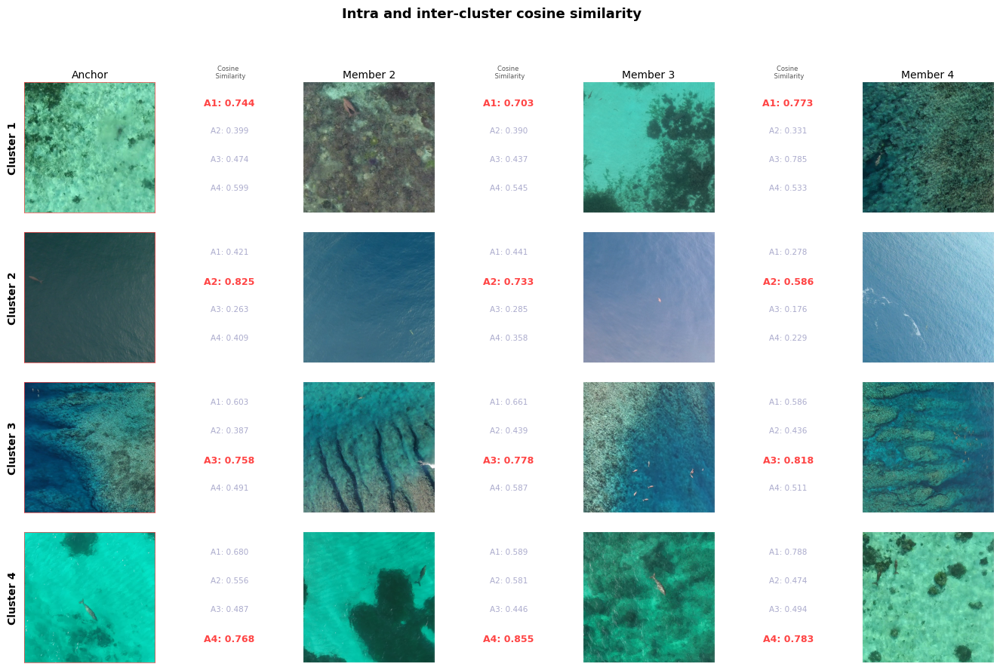

In [25]:
# Each list: [anchor_id, member2_id, member3_id, member4_id]
cluster_lists = [
    ['6a33c5818be790ca1e89bb9a',
 '6a33c5818be790ca1e89bc0b',
 '6a33c5818be790ca1e89bb3f',
 '6a33c2d28be790ca1e89a7fb'],
    ['6a33c2d28be790ca1e89a822',
 '6a33c2d28be790ca1e89a7ed',
 '6a33c2d28be790ca1e89a82d',
 '6a33c2d28be790ca1e89a8aa'],
    ['6a33c2d28be790ca1e89a6e6',
 '6a33c2d08be790ca1e89a409',
 '6a33c2d28be790ca1e89a770',
 '6a33c2d28be790ca1e89a92b'],
    ['6a33d1a619d8f6f6ef569335',
 '6a33d1a619d8f6f6ef56932a',
 '6a33d1a619d8f6f6ef5692fc',
 '6a33c5818be790ca1e89bb7c'],
]

fig = plot_cluster_cosine_grid(
    cluster_lists=cluster_lists,
    dataset=dataset,
    lookup=tile_lookup,    # built earlier via build_embedding_lookup()
    #save_path="/tmp/cluster_cosine_grid.png",
)